In [1]:
import numpy as np
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_PH1=pd.read_csv('PH1.csv')
df_PH2=pd.read_csv('PH2.csv')
df_PH3=pd.read_csv('PH3.csv')
df_PH4=pd.read_csv('PH4.csv')
df_PH5=pd.read_csv('PH5.csv')
df_PH6=pd.read_csv('PH6.csv')
df_PH7=pd.read_csv('PH7.csv')

# Phase 1 Feature Engineering

In [3]:
df_PH1.corr()

,ACID,ABRK,ELEV_1,ELEV_2,FLAP,N1CO,PACK,PH,SAT,SPLG,...,FPAC_Mean,IVV_Mean,AIL_1,AIL_2,A_T,BLV,EAI,FF,Total Fuel,OIT_Mean
ACID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ABRK,NaN,1.000000,0.017543,-0.005847,0.025204,0.027964,0.001861,NaN,0.020666,-0.024795,...,-0.007767,-0.053102,-0.012692,0.041104,0.027746,-0.038476,0.023862,-0.047096,-0.123632,0.203219
ELEV_1,NaN,0.017543,1.000000,0.160380,-0.036741,0.044859,0.016201,NaN,0.163257,0.007635,...,0.049343,0.025217,0.058402,0.056922,0.044991,-0.045637,0.037236,-0.031375,0.107746,0.164436
ELEV_2,NaN,-0.005847,0.160380,1.000000,0.054295,-0.002855,-0.011747,NaN,0.291388,-0.070582,...,-0.002548,-0.006807,0.064076,0.055465,-0.002858,0.104780,-0.011012,0.028196,0.061350,0.194036
FLAP,NaN,0.025204,-0.036741,0.054295,1.000000,0.007699,-0.007678,NaN,-0.009020,0.001908,...,-0.003056,-0.011104,0.007242,-0.001180,0.007698,-0.005215,-0.002141,-0.002378,0.031189,0.024666
N1CO,NaN,0.027964,0.044859,-0.002855,0.007699,1.000000,-0.124141,NaN,0.045161,0.237090,...,0.132900,-0.035555,0.031240,-0.045232,0.999837,-0.517571,-0.077574,-0.635938,0.202825,-0.149597
PACK,NaN,0.001861,0.016201,-0.011747,-0.007678,-0.124141,1.000000,NaN,0.132120,-0.159671,...,-0.038517,-0.075815,-0.058319,-0.019559,-0.124037,0.245323,0.013119,0.241929,0.090434,0.025712
PH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SAT,NaN,0.020666,0.163257,0.291388,-0.009020,0.045161,0.132120,NaN,1.000000,-0.056212,...,0.013484,0.021135,-0.133875,-0.039934,0.045086,0.029890,-0.010199,-0.012463,-0.012779,0.308258
SPLG,NaN,-0.024795,0.007635,-0.070582,0.001908,0.237090,-0.159671,NaN,-0.056212,1.000000,...,0.103050,-0.014934,0.015022,0.009056,0.237129,-0.404362,0.004254,-0.360899,0.085667,-0.066187


In [ ]:
df_PH1

# Applying PCA for dimensionality reduction

In [3]:
from fast_ml.model_development import train_valid_test_split

df_PH1.drop(['ACID','PH'],axis=1,inplace=True)
X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df_PH1, target = 'FF', 
                                                                            train_size=0.8, valid_size=0.1, test_size=0.1)

In [4]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_trainsc=scaler.fit_transform(X_train)
X_validsc=scaler.fit_transform(X_valid)
X_testsc=scaler.fit_transform(X_test)

In [5]:
# Generating the covariance matrix for PCA analysis
cov_matrix = np.cov(X_trainsc.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00002386  0.01752348 -0.0032742  ...  0.02244431 -0.12729375
   0.20854888]
 [ 0.01752348  1.00002386  0.16344171 ...  0.03558842  0.10824296
   0.16907324]
 [-0.0032742   0.16344171  1.00002386 ... -0.01189851  0.06331783
   0.1953437 ]
 ...
 [ 0.02244431  0.03558842 -0.01189851 ...  1.00002386  0.02882314
   0.01006695]
 [-0.12729375  0.10824296  0.06331783 ...  0.02882314  1.00002386
  -0.43349926]
 [ 0.20854888  0.16907324  0.1953437  ...  0.01006695 -0.43349926
   1.00002386]]


In [6]:
# Generating the eigen values and the eigen vectors
e_vals, e_vecs = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s' %e_vecs)
print('\n Eigen Values \n%s' %e_vals)

Eigen Vectors 
[[-0.01363378 -0.04726175 -0.09230018 ...  0.          0.
   0.        ]
 [-0.03158318 -0.00949359 -0.14493572 ...  0.          0.
   0.        ]
 [-0.07622129 -0.04821258 -0.07436412 ...  0.          0.
   0.        ]
 ...
 [-0.00315667 -0.02983532  0.01191906 ...  0.          0.
   0.        ]
 [ 0.009674    0.1867319  -0.03611797 ...  0.          0.
   0.        ]
 [-0.08141532 -0.24304535 -0.256115   ...  0.          0.
   0.        ]]

 Eigen Values 
[6.22250056e+00 5.24004825e+00 4.43016073e+00 3.08334160e+00
 2.49269036e+00 1.81546707e+00 1.79599570e+00 1.60640647e+00
 1.40630192e+00 1.30353589e+00 1.13155160e+00 1.13292144e+00
 1.06659160e+00 1.04290084e+00 1.01596517e+00 9.90237615e-01
 9.80889683e-01 9.43496059e-01 9.13403946e-01 8.76550103e-01
 8.60483895e-01 8.24669522e-01 7.87930951e-01 7.47257322e-01
 7.09885110e-01 6.24910373e-01 6.04467226e-01 5.85257461e-01
 5.34720239e-01 4.52695669e-01 4.46988126e-01 4.04637419e-01
 3.21370745e-01 2.95766019e-01 2.8233

In [7]:
# # Make a set of (eigenvalue, eigenvector) pairs
# eigen_pairs = [(np.abs(e_vals[i]), e_vecs[:,i]) for i in range(len(e_vals))]
# eigen_pairs.sort(reverse=True)
# eigen_pairs[:]

Cumulative Variance Explained [ 12.69867777  23.39239866  32.4333273   38.72571105  43.81271288
  47.51765933  51.18286924  54.46117159  57.33110703  59.99132089
  62.30335029  64.61258418  66.7892498   68.91756809  70.99091692
  73.0117618   75.01352973  76.93898595  78.80303116  80.59186625
  82.34791393  84.03087281  85.63885679  87.16383535  88.61254591
  89.88784278  91.12141993  92.31579442  93.40703418  94.33088085
  95.24307975  96.0688507   96.72469372  97.32828344  97.90445566
  98.45723453  98.93470433  99.3685006   99.69341488  99.85942303
  99.98276268  99.99613815  99.99814993  99.99946285  99.99988013
  99.99996465  99.99999781  99.9999998  100.         100.
 100.         100.         100.         100.         100.
 100.         100.        ]


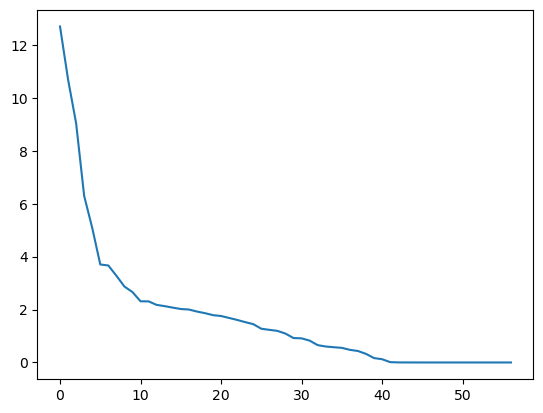

In [8]:
# The "Cumulative Variance Explained" analysis 
tot = sum(e_vals)
var_exp = [( i /tot ) * 100 for i in sorted(e_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)
plt.plot(var_exp);

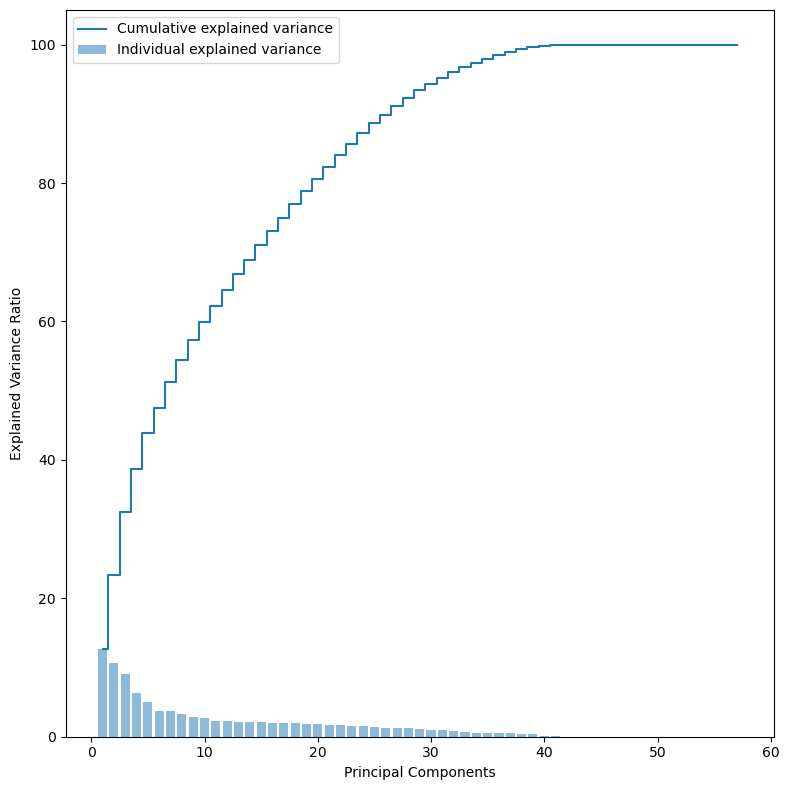

In [9]:
# Plotting the variance explained by the principal components and the cumulative variance explained.
plt.figure(figsize=(8 , 8))
plt.bar(range(1, e_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, e_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [10]:
P_reduce = np.array(e_vecs[0:24])   
X_std_10D = np.dot(X_trainsc,P_reduce.T)   
# converting array to dataframe for pairplot
df_PCA = pd.DataFrame(X_std_10D)  

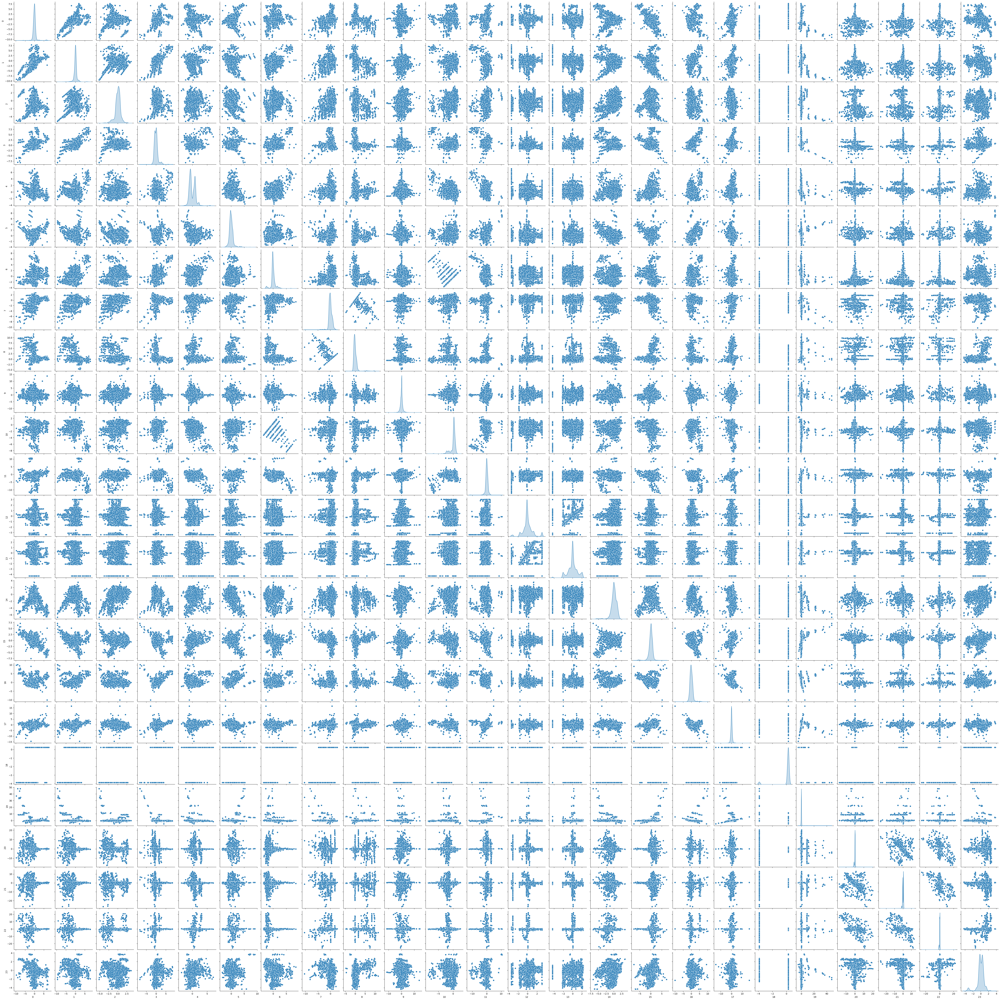

In [19]:
sns.pairplot(df_PCA, diag_kind='kde');

In [ ]:
# models={
#     "Decision Tree":DecisionTreeRegressor(),
#     "Random Forest Regressor":RandomForestRegressor(),
#     "Bagging Regressor":BaggingRegressor(),
#     "AdaBoost Regressor":AdaBoostRegressor(),
#     "XGBoost Regressor":XGBRegressor()
    
# }
# for i in range(len(list(models))):
#     model = list(models.values())[i]
#     model.fit(X_trainsc,y_train)
    
#     #predictions for validation
#     y_train_pred=model.predict(X_trainsc)
#     y_valid_pred=model.predict(X_validsc)
    
#     #Training set Performance
#     model_train_mae=mean_absolute_error(y_train,y_train_pred)
#     model_train_mse=mean_squared_error(y_train,y_train_pred)
#     model_train_rmse=mean_squared_error(y_train,y_train_pred,squared=False)
#     model_train_r2=r2_score(y_train,y_train_pred)
#     model_train_adj_r2= 1 - (1-model_train_r2) * (len(y_train)-1)/(len(y_train)-X_trainsc.shape[1]-1)
    
#     #Validation set Performance
#     model_valid_mae=mean_absolute_error(y_valid,y_valid_pred)
#     model_valid_mse=mean_squared_error(y_valid,y_valid_pred)
#     model_valid_rmse=mean_squared_error(y_valid,y_valid_pred,squared=False)
#     model_valid_r2=r2_score(y_valid,y_valid_pred)
#     model_valid_adj_r2= 1 - (1-model_valid_r2) * (len(y_valid)-1)/(len(y_valid)-X_validsc.shape[1]-1)
    
#     print(list(models.keys())[i])
    
#     print("Model performance for Training Set")
#     print("- MAE: {:.4f}".format(model_train_mae))
#     print("- MSE: {:.4f}".format(model_train_mse))
#     print("- RMSE: {:.4f}".format(model_train_rmse))
#     print("- R2 Score: {:.4f}".format(model_train_r2))
#     print("- Adjusted R2 Score: {:.4f}".format(model_train_adj_r2))
    
    
    
#     print("-------------------------------------------------------")
    
#     print("Model performance for Validation Set")
#     print("- MAE: {:.4f}".format(model_valid_mae))
#     print("- MSE: {:.4f}".format(model_valid_mse))
#     print("- RMSE: {:.4f}".format(model_valid_rmse))
#     print("- R2 Score: {:.4f}".format(model_valid_r2))
#     print("- Adjusted R2 Score: {:.4f}".format(model_valid_adj_r2))
    
#     print("="*35)
#     print("\n")
    
    
    

Linear Regression
Model performance for Training Set
- MAE: 321.6902
- MSE: 223690.7700
- RMSE: 472.9596
- R2 Score: 0.9596
- Adjusted R2 Score: 0.9596
-------------------------------------------------------
Model performance for Validation Set
- MAE: 322.2947
- MSE: 225203.6173
- RMSE: 474.5562
- R2 Score: 0.9595
- Adjusted R2 Score: 0.9595


Bayesian Regression
Model performance for Training Set
- MAE: 321.7033
- MSE: 223693.0122
- RMSE: 472.9620
- R2 Score: 0.9596
- Adjusted R2 Score: 0.9596
-------------------------------------------------------
Model performance for Validation Set
- MAE: 322.3095
- MSE: 225222.9417
- RMSE: 474.5766
- R2 Score: 0.9595
- Adjusted R2 Score: 0.9595


Lasso Regression
Model performance for Training Set
- MAE: 330.1263
- MSE: 233512.4692
- RMSE: 483.2313
- R2 Score: 0.9579
- Adjusted R2 Score: 0.9579
-------------------------------------------------------
Model performance for Validation Set
- MAE: 330.8342
- MSE: 234581.8265
- RMSE: 484.3365
- R2 Score

In [ ]:
# dt.fit(X_trainsc,y_train)
    
# #predictions for validation
# y_train_pred=dt.predict(X_trainsc)
# y_valid_pred=dt.predict(X_validsc)
  
# #Training set PerformanceF
# dt_train_mae=mean_absolute_error(y_train,y_train_pred)
# dt_train_mse=mean_squared_error(y_train,y_train_pred)
# dt_train_rmse=mean_squared_error(y_train,y_train_pred,squared=False)
# dt_train_r2=r2_score(y_train,y_train_pred)
# dt_train_adj_r2= 1 - (1-dt_train_r2) * (len(y_train)-1)/(len(y_train)-X_trainsc.shape[1]-1)
 
#     #Validation set Performance
# dt_valid_mae=mean_absolute_error(y_valid,y_valid_pred)
# dt_valid_mse=mean_squared_error(y_valid,y_valid_pred)
# dt_valid_rmse=mean_squared_error(y_valid,y_valid_pred,squared=False)
# dt_valid_r2=r2_score(y_valid,y_valid_pred)
# dt_valid_adj_r2= 1 - (1-dt_valid_r2) * (len(y_valid)-1)/(len(y_valid)-X_validsc.shape[1]-1)
  
# print("dt performance for Training Set")
# print("- MAE: {:.4f}".format(dt_train_mae))
# print("- MSE: {:.4f}".format(dt_train_mse))
# print("- RMSE: {:.4f}".format(dt_train_rmse))
# print("- R2 Score: {:.4f}".format(dt_train_r2))
# print("- Adjusted R2 Score: {:.4f}".format(dt_train_adj_r2))
  
    
    
# print("-------------------------------------------------------")
   
# print("dt performance for Validation Set")
# print("- MAE: {:.4f}".format(dt_valid_mae))
# print("- MSEscores=cross_val_score(logreg,iris.data,iris.target,cv=shuffle_split): {:.4f}".format(dt_valid_mse))
# print("- RMSE: {:.4f}".format(dt_valid_rmse))
# print("- R2 Score: {:.4f}".format(dt_valid_r2))
# print("- Adjusted R2 Score: {:.4f}".format(dt_valid_adj_r2))
  
# print("="*35)
# print("\n")

# Decision Tree

In [20]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import lightgbm as lgb
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import ShuffleSplit,cross_val_score
dt=DecisionTreeRegressor()
rf=RandomForestRegressor()
GBoost = GradientBoostingRegressor()
lgbm=lgb.LGBMRegressor()
ada=AdaBoostRegressor()
xgb=XGBRegressor()
stack=StackingRegressor(estimators=[dt,rf,lgbm,ada,xgb], final_estimator=xgb,cv=5)



shuffle_split=ShuffleSplit(test_size=0.3,train_size=0.5,n_splits=10)


scores=cross_val_score(dt,X_trainsc,y_train,cv=shuffle_split,scoring='r2' )
print("Cross Validation scores for Decision Tree: {}".format(scores))
print('\n')
print("Average Cross Validation score :{}".format(scores.mean()*100))
print("\n")
print("="*35)

scores=cross_val_score(rf,X_trainsc,y_train,cv=shuffle_split,scoring='r2' )
print("Cross Validation scores for Random Forests : {}".format(scores))
print('\n')
print("Average Cross Validation score :{}".format(scores.mean()*100))
print("\n")
print("="*35)

scores=cross_val_score(lgbm,X_trainsc,y_train,cv=shuffle_split,scoring='r2' )
print("Cross Validation scores for LightGBM {}".format(scores))
print('\n')
print("Average Cross Validation score :{}".format(scores.mean()*100))
print("\n")
print("="*35)

scores=cross_val_score(ada,X_trainsc,y_train,cv=shuffle_split,scoring='r2' )
print("Cross Validation scores for Adaboost: {}".format(scores))
print('\n')
print("Average Cross Validation score :{}".format(scores.mean()*100))
print("\n")
print("="*35)

scores=cross_val_score(GBoost,X_trainsc,y_train,cv=shuffle_split,scoring='r2')
print("Cross Validation scores for Gradient Boosting Regressor: {}".format(scores))
print('\n')
print("Average Cross Validation score :{}".format(scores.mean()*100))
print("\n")
print("="*35)

scores=cross_val_score(xgb,X_trainsc,y_train,cv=shuffle_split,scoring='r2' )
print("Cross Validation scores for XGB Regressor: {}".format(scores))
print('\n')
print("Average Cross Validation score :{}".format(scores.mean()*100))
print("\n")
print("="*35)


Cross Validation scores for Decision Tree: [0.89070254 0.88710809 0.82565163 0.87760245 0.84856315 0.82975381
 0.89601544 0.88713109 0.8676152  0.88930295]


Average Cross Validation score :86.99446356692032


Cross Validation scores for Random Forests : [0.92445243 0.94025598 0.93330814 0.93163253 0.93639345 0.93088782
 0.92233522 0.94022434 0.94342616 0.93153235]


Average Cross Validation score :93.34448424153543


Cross Validation scores for LightGBM [0.92706311 0.91417222 0.92098463 0.9115758  0.92648821 0.91620012
 0.9149058  0.93202564 0.92473847 0.9179219 ]


Average Cross Validation score :92.06075905913072


Cross Validation scores for Adaboost: [ 0.50632641 -0.58171235 -0.3394964  -0.20448565 -0.89193125 -0.61089171
 -0.71655731 -0.38246614  0.36469945 -0.89810247]


Average Cross Validation score :-37.54617424062351


Cross Validation scores for Gradient Boosting Regressor: [0.88783798 0.90783781 0.8917056  0.89528445 0.89366722 0.89222053
 0.90119881 0.89968829 0.89654848 

TypeError: 'DecisionTreeRegressor' object is not iterable

# Random Forest Hyper Parameter Tuning

In [24]:
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_trainsc,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [ ]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

In [ ]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, X_valid, Y_valid)